In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_A2-1.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 80252 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_ec'] = (adata.X[:,adata.var_names=='GJA5'] > 1) & (adata.X[:,adata.var_names=='VWF'] > 1)

In [7]:
adata_aec = adata[adata.obs['arterial_ec'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 491 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_ec'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

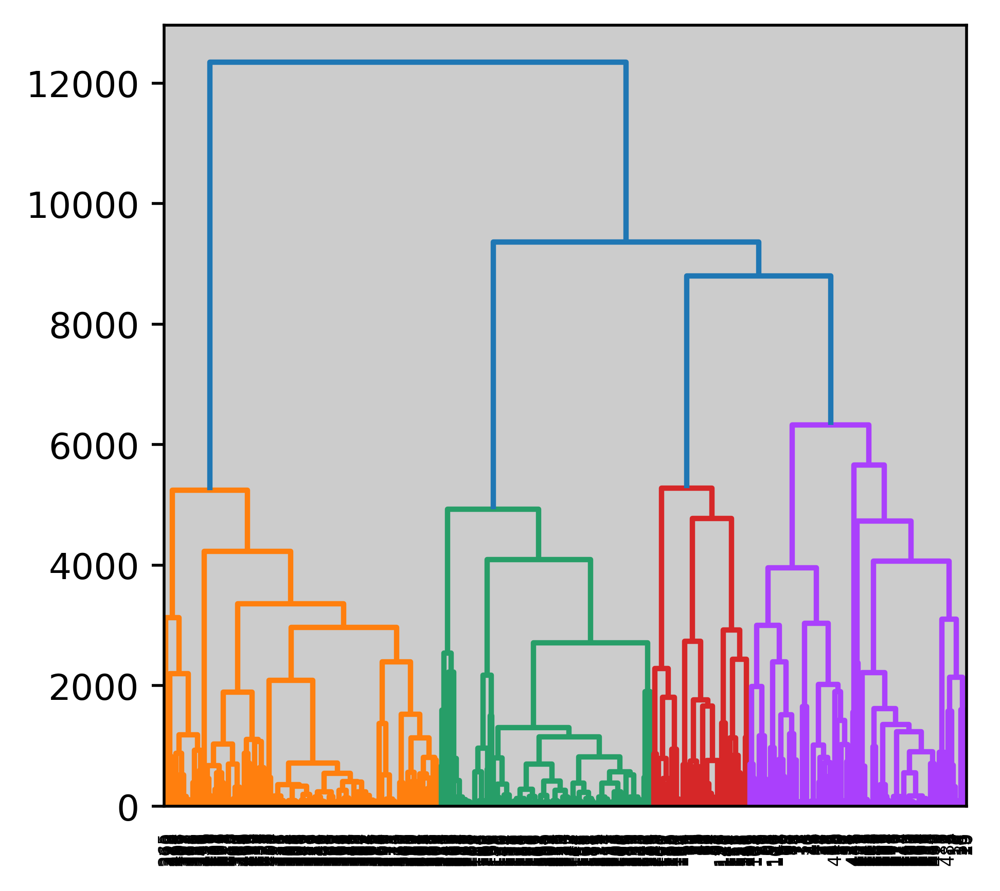

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=160, affinity='euclidean', linkage='single')

In [13]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[118 136 140 140  91  93 145  57  57  37  57  57  37  92  37  37  37 108
 129 146 146  59  59  59  64 153  64  80  80  31  31  31  31  31 103   1
   1   1  45 113  44  44  44  44  44 157  83  71  71   2  13  13   2   2
  85 122 106 106 106   8 115  95 158  49  49   8   8  39 143 150  39 109
 109  10 109 109  10 109 109  10 127  10   6   6   6  89   6   6   6   6
   6 159 116  14  14  84 139  99 114 101  82  20  20  47  47 104 104 104
 104  28 149  28 104  28  28  15  15 142  70  70  70 151 100 133  94  94
  54  54  41 131 107  26  26  26  26  26  26  26  26  26  26  87  26 128
  26  26 119  26 120  53  26  26  26  26  79 135  26  26  26  26  79  79
  26  26  79  79  79  26  26  26  26  26  26  26  26  26  26  26 130  26
  26  26  26  26  26  26  26  32  32  88  32  32  32  26  26  26 137  26
  26  26  56  26  26  26  26  26  26  26  46  46  26  26  26  26  26  26
  26  26  26  26  26  26  26  26  26  26  26  26  26  26  26  26  26  26
  26  26  26  26  26  26  26  26  26  26  67 117 11

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [14]:
adata_aec.obs['Artery_clusters'] = labels
adata_aec.obs['Artery_clusters'] = adata_aec.obs['Artery_clusters'].astype('category')

/var/tmp/pbs.8217755.pbs/ipykernel_3400878/2590496195.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['Artery_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [15]:
adata_aec.obs['Artery_clusters'].value_counts()

26     90
12     65
27     15
69     10
22      9
       ..
88      1
87      1
86      1
85      1
159     1
Name: Artery_clusters, Length: 160, dtype: int64

In [16]:
# subset for clusters > 5 bins
adata_aec.obs['Artery_clusters'].value_counts()[adata_aec.obs['Artery_clusters'].value_counts() > 5].index.tolist()

[26, 12, 27, 69, 22, 6, 51, 4, 42, 62, 79, 25, 109]

In [17]:
adata_aec_subset = adata_aec[adata_aec.obs.Artery_clusters.isin(adata_aec.obs['Artery_clusters'].value_counts()[adata_aec.obs['Artery_clusters'].value_counts() > 5].index.tolist())]

In [18]:
adata_aec_subset.obs.Artery_clusters = adata_aec_subset.obs.Artery_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [19]:
adata_aec

AnnData object with n_obs × n_vars = 491 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_ec', 'Artery_clusters'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

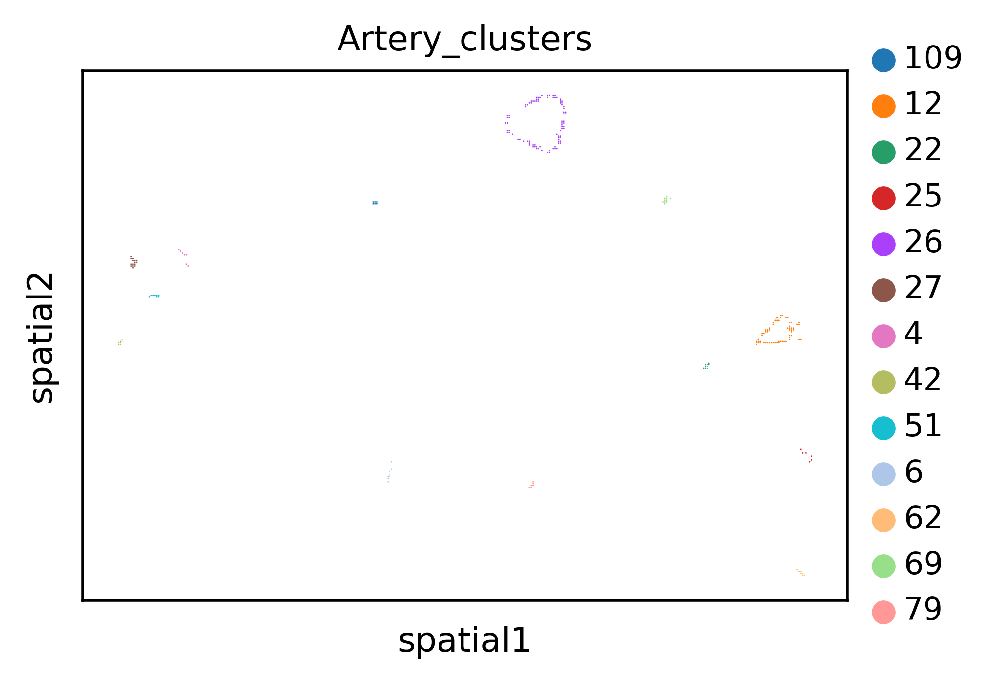

In [20]:
sc.pl.spatial(adata_aec_subset,color="Artery_clusters",img_key=None,size=8, alpha_img = 0.2, vmax = 1)

In [21]:
#sc.pl.spatial(adata,color="GJA5",img_key='WGA',size=8, alpha_img = 0.2, vmax = 1)

In [22]:
#del adata_aec.uns['Artery_clusters_colors']
#del adata_aec_subset.uns['Artery_clusters_colors']

In [23]:
#sc.pl.spatial(adata_aec, color="Artery_clusters",img_key='WGA',size=8, alpha_img = 0.2)

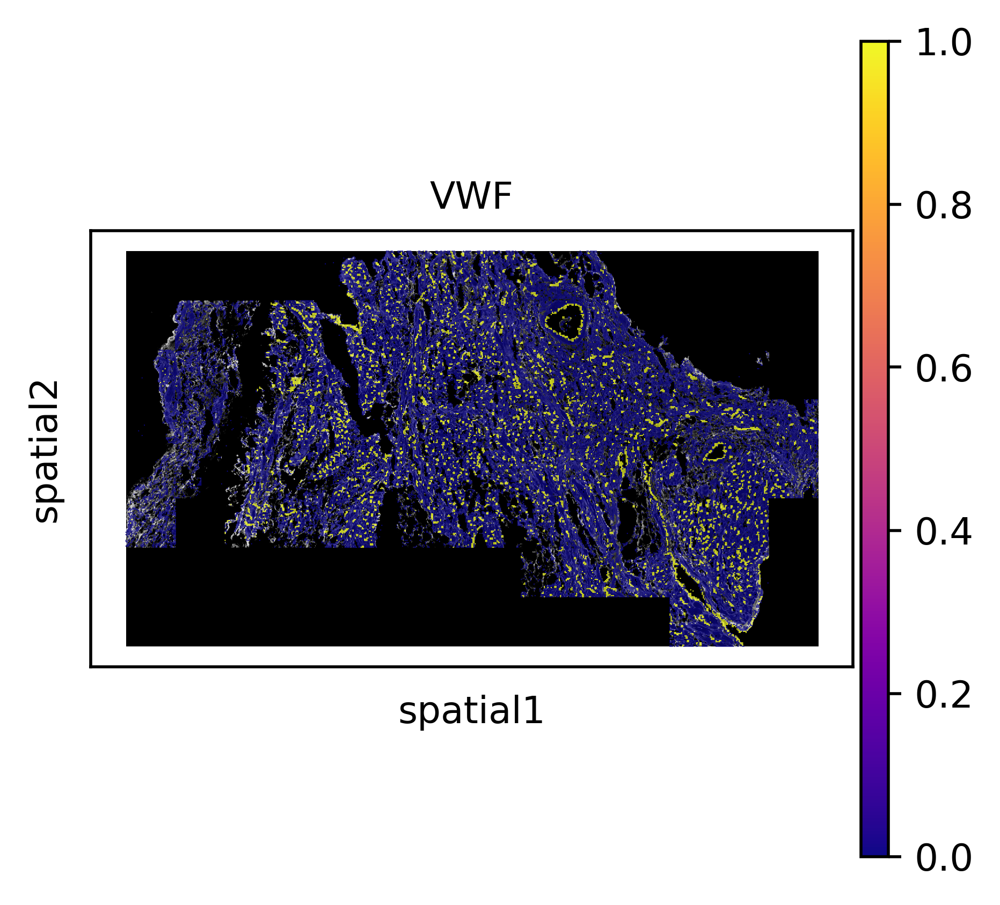

In [24]:
sc.pl.spatial(adata, color=["VWF"],img_key='WGA', size=10, vmax = 1, cmap = 'plasma')

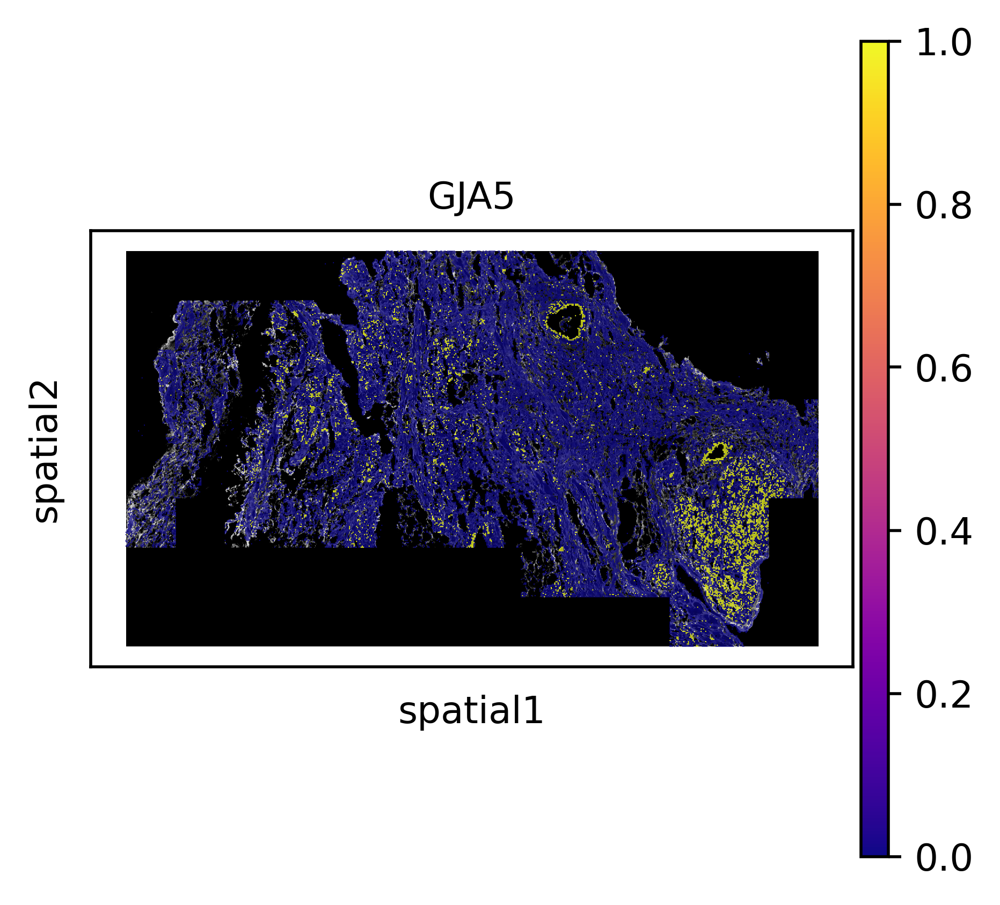

In [25]:
sc.pl.spatial(adata, color=["GJA5"],img_key='WGA', size=10, vmax = 1, cmap = 'plasma')

In [26]:
genes=["VWF","GJA5"]

In [27]:
genedf=pd.DataFrame(index=adata.obs.index)
for i in genes:
    genedf[i]=np.asarray(pd.DataFrame(adata[:, i].X))

In [28]:
genedf

,VWF,GJA5
X_Y_bins,,
0.0_12200.0,0,0
0.0_12300.0,0,0
0.0_12550.0,0,0
0.0_12600.0,0,0
0.0_12800.0,0,0
...,...,...
9950.0_9750.0,0,0
9950.0_9800.0,0,0
9950.0_9850.0,2,0


In [29]:
group=pd.Series("None", index=adata.obs.index)

In [30]:
gene1="VWF"
gene2="GJA5"

group[(genedf[gene1] > 0)] = gene1
group[(genedf[gene2] > 0)] = gene2
group[(genedf[gene1]> 0) & (genedf[gene2] > 0)] = gene1+"/"+gene2

group.replace("None", np.nan, inplace=True) # replace 0 with nan for better plotting down the line
adata.obs["coloc"]=group


In [31]:
group

X_Y_bins
0.0_12200.0      NaN
0.0_12300.0      NaN
0.0_12550.0      NaN
0.0_12600.0      NaN
0.0_12800.0      NaN
                ... 
9950.0_9750.0    NaN
9950.0_9800.0    NaN
9950.0_9850.0    VWF
9950.0_9900.0    VWF
9950.0_9950.0    VWF
Length: 80252, dtype: object

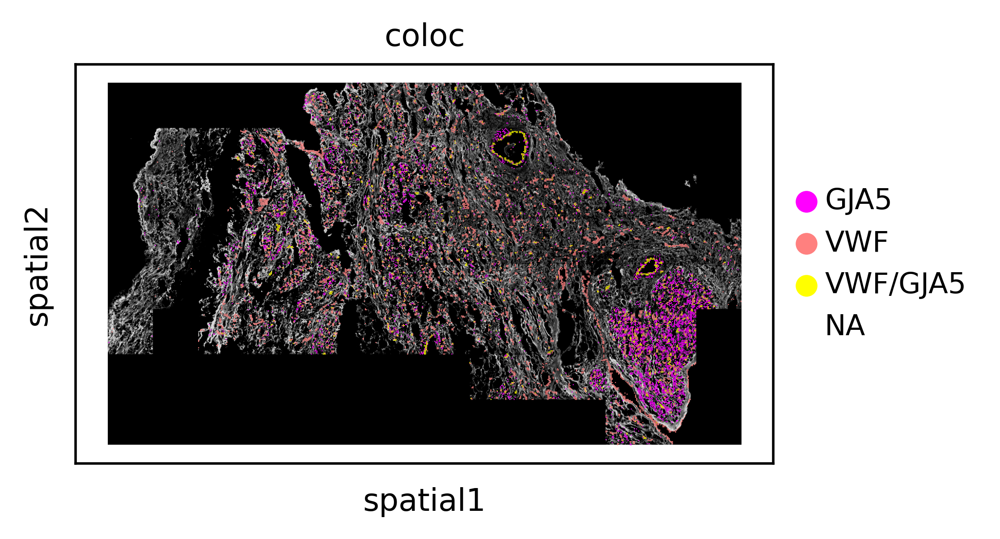

In [32]:
sc.pl.spatial(adata,color="coloc",img_key="WGA",size=10, palette = 'spring')

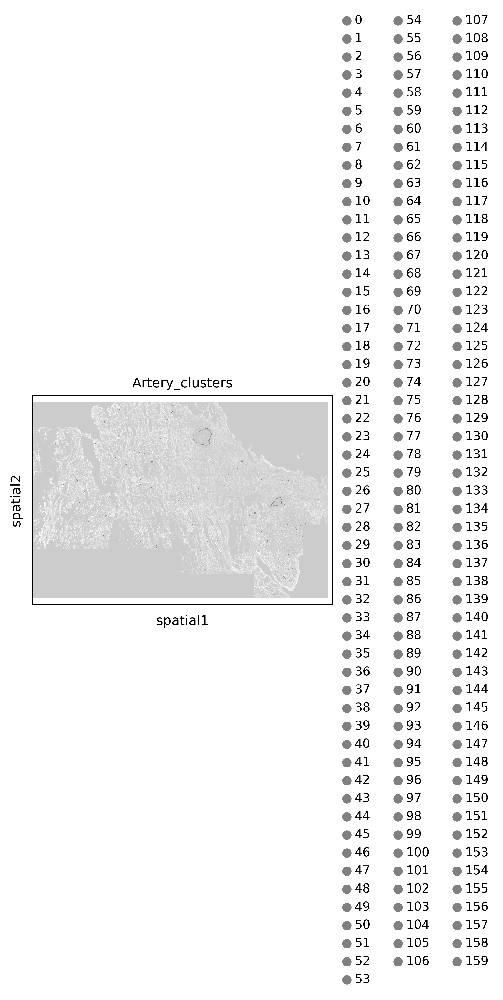

In [33]:
sc.pl.spatial(adata_aec,
              color="Artery_clusters",img_key='WGA',size=10, alpha_img = 0.2)

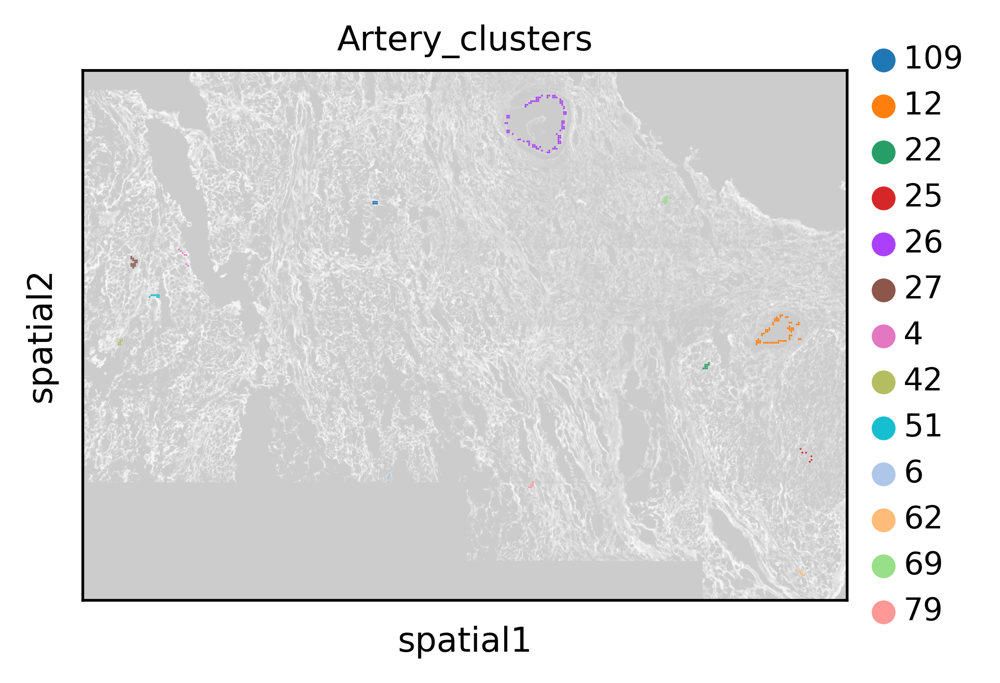

In [34]:
sc.pl.spatial(adata_aec_subset,
              color="Artery_clusters",img_key='WGA',size=10, alpha_img = 0.2)

In [ ]:
sc.pl.spatial(adata_aec_subset,
              color="Artery_clusters",img_key='WGA',size=6)

### obtain bins percent expressing values

In [21]:
adata_aec_subset.obs['SULF1_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='SULF1'] > 1)

In [22]:
adata_aec_subset.obs['NEBL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='NEBL'] > 1)

In [23]:
adata_aec_subset.obs['SEMA3G_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='SEMA3G'] > 0)

In [24]:
adata_aec_subset.obs['RGCC_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RGCC'] > 0)

## add raw values

In [42]:
df_sum=matrix.groupby("Artery_clusters").sum()

In [43]:
df_sum[["SULF1","NEBL","SEMA3G","RGCC","GJA5"]]

Genes,SULF1,NEBL,SEMA3G,RGCC,GJA5
Artery_clusters,,,,,
109,0.0,2.0,9.0,3.0,65.0
12,130.0,4.0,19.0,1.0,556.0
22,3.0,2.0,5.0,0.0,41.0
25,0.0,9.0,1.0,12.0,13.0
26,249.0,0.0,4.0,1.0,618.0
27,1.0,1.0,9.0,1.0,136.0
4,0.0,3.0,0.0,20.0,19.0
42,2.0,1.0,1.0,2.0,33.0
51,1.0,1.0,0.0,2.0,44.0


In [44]:
test3 = pd.concat([test2, df_sum[["SULF1","NEBL","SEMA3G","RGCC"]]], axis = 1)

In [45]:
test3

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent,SULF1_mean,NEBL_mean,SEMA3G_mean,RGCC_mean,SULF1,NEBL,SEMA3G,RGCC
Artery_clusters,,,,,,,,,,,,,
109,0.0,0.000000,0.166667,0.833333,0.333333,NaN,2.00,1.800000,1.500000,0.0,2.0,9.0,3.0
12,0.0,0.523077,0.000000,0.246154,0.015385,2.653061,1.00,1.187500,1.000000,130.0,4.0,19.0,1.0
22,0.0,0.111111,0.000000,0.444444,0.000000,1.500000,1.00,1.250000,NaN,3.0,2.0,5.0,0.0
25,0.0,0.000000,0.500000,0.166667,0.500000,NaN,2.25,1.000000,4.000000,0.0,9.0,1.0,12.0
26,0.0,0.511111,0.000000,0.044444,0.011111,4.016129,NaN,1.000000,1.000000,249.0,0.0,4.0,1.0
27,0.0,0.000000,0.000000,0.466667,0.066667,1.000000,1.00,1.285714,1.000000,1.0,1.0,9.0,1.0
4,0.0,0.000000,0.142857,0.000000,0.857143,NaN,1.50,NaN,3.333333,0.0,3.0,0.0,20.0
42,0.0,0.000000,0.000000,0.142857,0.142857,1.000000,1.00,1.000000,2.000000,2.0,1.0,1.0,2.0
51,0.0,0.000000,0.000000,0.000000,0.125000,1.000000,1.00,NaN,2.000000,1.0,1.0,0.0,2.0


In [25]:
adata_aec_subset.obs['SULF1+NEBL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='SULF1'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='NEBL'] > 1)

In [26]:
adata_aec_subset

AnnData object with n_obs × n_vars = 244 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_ec', 'Artery_clusters', 'SULF1_percent', 'NEBL_percent', 'SEMA3G_percent', 'RGCC_percent', 'SULF1+NEBL_percent'
    var: 'Genes'
    uns: 'spatial', 'Artery_clusters_colors'
    obsm: 'spatial'

In [27]:
results = adata_aec_subset.obs[['SULF1+NEBL_percent','SULF1_percent','NEBL_percent','SEMA3G_percent','RGCC_percent','Artery_clusters']].groupby('Artery_clusters').mean()

In [28]:
results

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent
Artery_clusters,,,,,
109,0.0,0.000000,0.166667,0.833333,0.333333
12,0.0,0.523077,0.000000,0.246154,0.015385
22,0.0,0.111111,0.000000,0.444444,0.000000
25,0.0,0.000000,0.500000,0.166667,0.500000
26,0.0,0.511111,0.000000,0.044444,0.011111
27,0.0,0.000000,0.000000,0.466667,0.066667
4,0.0,0.000000,0.142857,0.000000,0.857143
42,0.0,0.000000,0.000000,0.142857,0.142857
51,0.0,0.000000,0.000000,0.000000,0.125000


### obtain mean expression (all bins / cluster)

In [29]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [30]:
matrix["Artery_clusters"] = adata_aec_subset.obs["Artery_clusters"]

In [31]:
df_mean=matrix.groupby("Artery_clusters").mean()

In [32]:
df_mean[["SULF1","NEBL","SEMA3G","RGCC"]]

Genes,SULF1,NEBL,SEMA3G,RGCC
Artery_clusters,,,,
109,0.000000,0.333333,1.500000,0.500000
12,2.000000,0.061538,0.292308,0.015385
22,0.333333,0.222222,0.555556,0.000000
25,0.000000,1.500000,0.166667,2.000000
26,2.766667,0.000000,0.044444,0.011111
27,0.066667,0.066667,0.600000,0.066667
4,0.000000,0.428571,0.000000,2.857143
42,0.285714,0.142857,0.142857,0.285714
51,0.125000,0.125000,0.000000,0.250000


### obtain mean expression (expressing bins only / cluster)

In [33]:
matrix2 = matrix.replace(0, np.NaN)

In [34]:
df_mean_nonzero =matrix2.groupby("Artery_clusters").mean()

In [35]:
df_mean_nonzero[["SULF1","NEBL","SEMA3G","RGCC"]]

Genes,SULF1,NEBL,SEMA3G,RGCC
Artery_clusters,,,,
109,NaN,2.00,1.800000,1.500000
12,2.653061,1.00,1.187500,1.000000
22,1.500000,1.00,1.250000,NaN
25,NaN,2.25,1.000000,4.000000
26,4.016129,NaN,1.000000,1.000000
27,1.000000,1.00,1.285714,1.000000
4,NaN,1.50,NaN,3.333333
42,1.000000,1.00,1.000000,2.000000
51,1.000000,1.00,NaN,2.000000


### add expression values to dataframe

In [36]:
#mean expression (all bins / cluster)
test = pd.concat([results, df_mean[["SULF1","NEBL","SEMA3G","RGCC"]]], axis = 1)

In [37]:
test

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent,SULF1,NEBL,SEMA3G,RGCC
Artery_clusters,,,,,,,,,
109,0.0,0.000000,0.166667,0.833333,0.333333,0.000000,0.333333,1.500000,0.500000
12,0.0,0.523077,0.000000,0.246154,0.015385,2.000000,0.061538,0.292308,0.015385
22,0.0,0.111111,0.000000,0.444444,0.000000,0.333333,0.222222,0.555556,0.000000
25,0.0,0.000000,0.500000,0.166667,0.500000,0.000000,1.500000,0.166667,2.000000
26,0.0,0.511111,0.000000,0.044444,0.011111,2.766667,0.000000,0.044444,0.011111
27,0.0,0.000000,0.000000,0.466667,0.066667,0.066667,0.066667,0.600000,0.066667
4,0.0,0.000000,0.142857,0.000000,0.857143,0.000000,0.428571,0.000000,2.857143
42,0.0,0.000000,0.000000,0.142857,0.142857,0.285714,0.142857,0.142857,0.285714
51,0.0,0.000000,0.000000,0.000000,0.125000,0.125000,0.125000,0.000000,0.250000


In [38]:
#mean expression (expressing bins only / cluster)
test2 = pd.concat([results, df_mean_nonzero[["SULF1","NEBL","SEMA3G","RGCC"]]], axis = 1)

In [39]:
test2

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent,SULF1,NEBL,SEMA3G,RGCC
Artery_clusters,,,,,,,,,
109,0.0,0.000000,0.166667,0.833333,0.333333,NaN,2.00,1.800000,1.500000
12,0.0,0.523077,0.000000,0.246154,0.015385,2.653061,1.00,1.187500,1.000000
22,0.0,0.111111,0.000000,0.444444,0.000000,1.500000,1.00,1.250000,NaN
25,0.0,0.000000,0.500000,0.166667,0.500000,NaN,2.25,1.000000,4.000000
26,0.0,0.511111,0.000000,0.044444,0.011111,4.016129,NaN,1.000000,1.000000
27,0.0,0.000000,0.000000,0.466667,0.066667,1.000000,1.00,1.285714,1.000000
4,0.0,0.000000,0.142857,0.000000,0.857143,NaN,1.50,NaN,3.333333
42,0.0,0.000000,0.000000,0.142857,0.142857,1.000000,1.00,1.000000,2.000000
51,0.0,0.000000,0.000000,0.000000,0.125000,1.000000,1.00,NaN,2.000000


In [40]:
test2.rename(columns={"SULF1": "SULF1_mean", "NEBL": "NEBL_mean", "SEMA3G": "SEMA3G_mean", "RGCC": "RGCC_mean"}, inplace = True)

In [41]:
test2

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent,SULF1_mean,NEBL_mean,SEMA3G_mean,RGCC_mean
Artery_clusters,,,,,,,,,
109,0.0,0.000000,0.166667,0.833333,0.333333,NaN,2.00,1.800000,1.500000
12,0.0,0.523077,0.000000,0.246154,0.015385,2.653061,1.00,1.187500,1.000000
22,0.0,0.111111,0.000000,0.444444,0.000000,1.500000,1.00,1.250000,NaN
25,0.0,0.000000,0.500000,0.166667,0.500000,NaN,2.25,1.000000,4.000000
26,0.0,0.511111,0.000000,0.044444,0.011111,4.016129,NaN,1.000000,1.000000
27,0.0,0.000000,0.000000,0.466667,0.066667,1.000000,1.00,1.285714,1.000000
4,0.0,0.000000,0.142857,0.000000,0.857143,NaN,1.50,NaN,3.333333
42,0.0,0.000000,0.000000,0.142857,0.142857,1.000000,1.00,1.000000,2.000000
51,0.0,0.000000,0.000000,0.000000,0.125000,1.000000,1.00,NaN,2.000000


## add raw values

In [42]:
df_sum=matrix.groupby("Artery_clusters").sum()

In [43]:
df_sum[["SULF1","NEBL","SEMA3G","RGCC","GJA5"]]

Genes,SULF1,NEBL,SEMA3G,RGCC,GJA5
Artery_clusters,,,,,
109,0.0,2.0,9.0,3.0,65.0
12,130.0,4.0,19.0,1.0,556.0
22,3.0,2.0,5.0,0.0,41.0
25,0.0,9.0,1.0,12.0,13.0
26,249.0,0.0,4.0,1.0,618.0
27,1.0,1.0,9.0,1.0,136.0
4,0.0,3.0,0.0,20.0,19.0
42,2.0,1.0,1.0,2.0,33.0
51,1.0,1.0,0.0,2.0,44.0


In [44]:
test3 = pd.concat([test2, df_sum[["SULF1","NEBL","SEMA3G","RGCC"]]], axis = 1)

In [45]:
test3

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent,SULF1_mean,NEBL_mean,SEMA3G_mean,RGCC_mean,SULF1,NEBL,SEMA3G,RGCC
Artery_clusters,,,,,,,,,,,,,
109,0.0,0.000000,0.166667,0.833333,0.333333,NaN,2.00,1.800000,1.500000,0.0,2.0,9.0,3.0
12,0.0,0.523077,0.000000,0.246154,0.015385,2.653061,1.00,1.187500,1.000000,130.0,4.0,19.0,1.0
22,0.0,0.111111,0.000000,0.444444,0.000000,1.500000,1.00,1.250000,NaN,3.0,2.0,5.0,0.0
25,0.0,0.000000,0.500000,0.166667,0.500000,NaN,2.25,1.000000,4.000000,0.0,9.0,1.0,12.0
26,0.0,0.511111,0.000000,0.044444,0.011111,4.016129,NaN,1.000000,1.000000,249.0,0.0,4.0,1.0
27,0.0,0.000000,0.000000,0.466667,0.066667,1.000000,1.00,1.285714,1.000000,1.0,1.0,9.0,1.0
4,0.0,0.000000,0.142857,0.000000,0.857143,NaN,1.50,NaN,3.333333,0.0,3.0,0.0,20.0
42,0.0,0.000000,0.000000,0.142857,0.142857,1.000000,1.00,1.000000,2.000000,2.0,1.0,1.0,2.0
51,0.0,0.000000,0.000000,0.000000,0.125000,1.000000,1.00,NaN,2.000000,1.0,1.0,0.0,2.0


### add cluster size (no. bins / vessel)

In [46]:
results2 = test3.join(adata_aec_subset.obs['Artery_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [47]:
results2.columns = list(results2.columns[0:13]) + ['size']

In [48]:
results2

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent,SULF1_mean,NEBL_mean,SEMA3G_mean,RGCC_mean,SULF1,NEBL,SEMA3G,RGCC,size
Artery_clusters,,,,,,,,,,,,,,
109,0.0,0.000000,0.166667,0.833333,0.333333,NaN,2.00,1.800000,1.500000,0.0,2.0,9.0,3.0,6
12,0.0,0.523077,0.000000,0.246154,0.015385,2.653061,1.00,1.187500,1.000000,130.0,4.0,19.0,1.0,65
22,0.0,0.111111,0.000000,0.444444,0.000000,1.500000,1.00,1.250000,NaN,3.0,2.0,5.0,0.0,9
25,0.0,0.000000,0.500000,0.166667,0.500000,NaN,2.25,1.000000,4.000000,0.0,9.0,1.0,12.0,6
26,0.0,0.511111,0.000000,0.044444,0.011111,4.016129,NaN,1.000000,1.000000,249.0,0.0,4.0,1.0,90
27,0.0,0.000000,0.000000,0.466667,0.066667,1.000000,1.00,1.285714,1.000000,1.0,1.0,9.0,1.0,15
4,0.0,0.000000,0.142857,0.000000,0.857143,NaN,1.50,NaN,3.333333,0.0,3.0,0.0,20.0,7
42,0.0,0.000000,0.000000,0.142857,0.142857,1.000000,1.00,1.000000,2.000000,2.0,1.0,1.0,2.0,7
51,0.0,0.000000,0.000000,0.000000,0.125000,1.000000,1.00,NaN,2.000000,1.0,1.0,0.0,2.0,8


### add ROI numbers

In [49]:
results2.index = ['ROI_A2-1_' + str(i) for i in results2.index.tolist()]

In [50]:
results2

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent,SULF1_mean,NEBL_mean,SEMA3G_mean,RGCC_mean,SULF1,NEBL,SEMA3G,RGCC,size
ROI_A2-1_109,0.0,0.000000,0.166667,0.833333,0.333333,NaN,2.00,1.800000,1.500000,0.0,2.0,9.0,3.0,6
ROI_A2-1_12,0.0,0.523077,0.000000,0.246154,0.015385,2.653061,1.00,1.187500,1.000000,130.0,4.0,19.0,1.0,65
ROI_A2-1_22,0.0,0.111111,0.000000,0.444444,0.000000,1.500000,1.00,1.250000,NaN,3.0,2.0,5.0,0.0,9
ROI_A2-1_25,0.0,0.000000,0.500000,0.166667,0.500000,NaN,2.25,1.000000,4.000000,0.0,9.0,1.0,12.0,6
ROI_A2-1_26,0.0,0.511111,0.000000,0.044444,0.011111,4.016129,NaN,1.000000,1.000000,249.0,0.0,4.0,1.0,90
ROI_A2-1_27,0.0,0.000000,0.000000,0.466667,0.066667,1.000000,1.00,1.285714,1.000000,1.0,1.0,9.0,1.0,15
ROI_A2-1_4,0.0,0.000000,0.142857,0.000000,0.857143,NaN,1.50,NaN,3.333333,0.0,3.0,0.0,20.0,7
ROI_A2-1_42,0.0,0.000000,0.000000,0.142857,0.142857,1.000000,1.00,1.000000,2.000000,2.0,1.0,1.0,2.0,7
ROI_A2-1_51,0.0,0.000000,0.000000,0.000000,0.125000,1.000000,1.00,NaN,2.000000,1.0,1.0,0.0,2.0,8
ROI_A2-1_6,0.0,0.000000,0.000000,0.000000,0.500000,NaN,1.00,NaN,2.750000,0.0,1.0,0.0,11.0,8


In [51]:
results2["ROI"] = "A2-1"

In [52]:
results2

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SEMA3G_percent,RGCC_percent,SULF1_mean,NEBL_mean,SEMA3G_mean,RGCC_mean,SULF1,NEBL,SEMA3G,RGCC,size,ROI
ROI_A2-1_109,0.0,0.000000,0.166667,0.833333,0.333333,NaN,2.00,1.800000,1.500000,0.0,2.0,9.0,3.0,6,A2-1
ROI_A2-1_12,0.0,0.523077,0.000000,0.246154,0.015385,2.653061,1.00,1.187500,1.000000,130.0,4.0,19.0,1.0,65,A2-1
ROI_A2-1_22,0.0,0.111111,0.000000,0.444444,0.000000,1.500000,1.00,1.250000,NaN,3.0,2.0,5.0,0.0,9,A2-1
ROI_A2-1_25,0.0,0.000000,0.500000,0.166667,0.500000,NaN,2.25,1.000000,4.000000,0.0,9.0,1.0,12.0,6,A2-1
ROI_A2-1_26,0.0,0.511111,0.000000,0.044444,0.011111,4.016129,NaN,1.000000,1.000000,249.0,0.0,4.0,1.0,90,A2-1
ROI_A2-1_27,0.0,0.000000,0.000000,0.466667,0.066667,1.000000,1.00,1.285714,1.000000,1.0,1.0,9.0,1.0,15,A2-1
ROI_A2-1_4,0.0,0.000000,0.142857,0.000000,0.857143,NaN,1.50,NaN,3.333333,0.0,3.0,0.0,20.0,7,A2-1
ROI_A2-1_42,0.0,0.000000,0.000000,0.142857,0.142857,1.000000,1.00,1.000000,2.000000,2.0,1.0,1.0,2.0,7,A2-1
ROI_A2-1_51,0.0,0.000000,0.000000,0.000000,0.125000,1.000000,1.00,NaN,2.000000,1.0,1.0,0.0,2.0,8,A2-1
ROI_A2-1_6,0.0,0.000000,0.000000,0.000000,0.500000,NaN,1.00,NaN,2.750000,0.0,1.0,0.0,11.0,8,A2-1


### define size group (small / large)

In [ ]:
# remove undesired vessels here (i.e. at edge of frame)

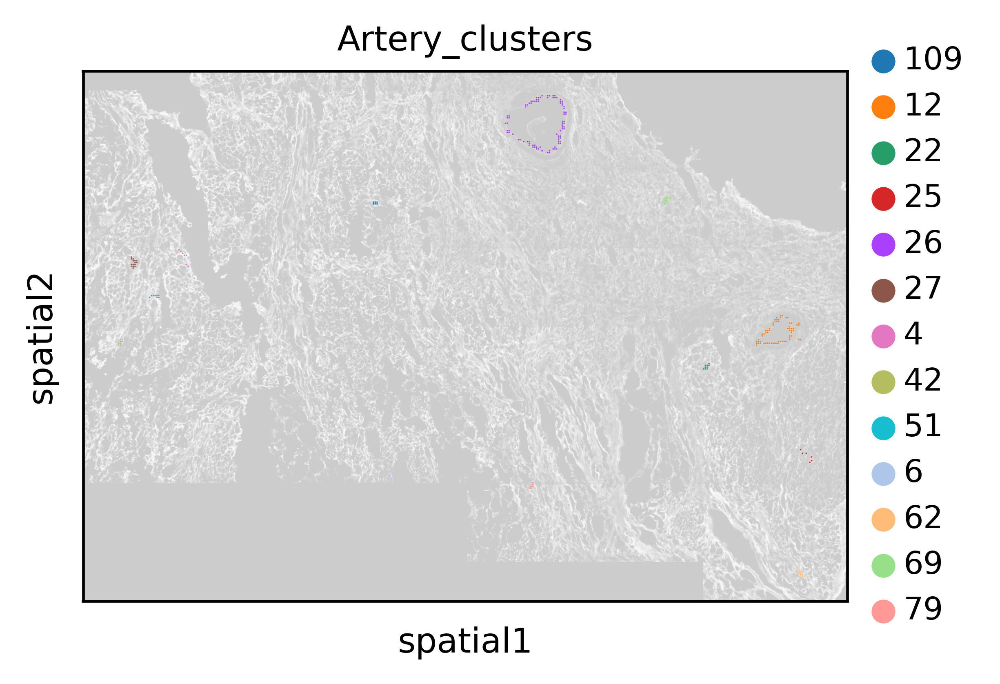

In [88]:
sc.pl.spatial(adata_aec_subset,color="Artery_clusters",img_key='WGA',size=8, alpha_img = 0.2)

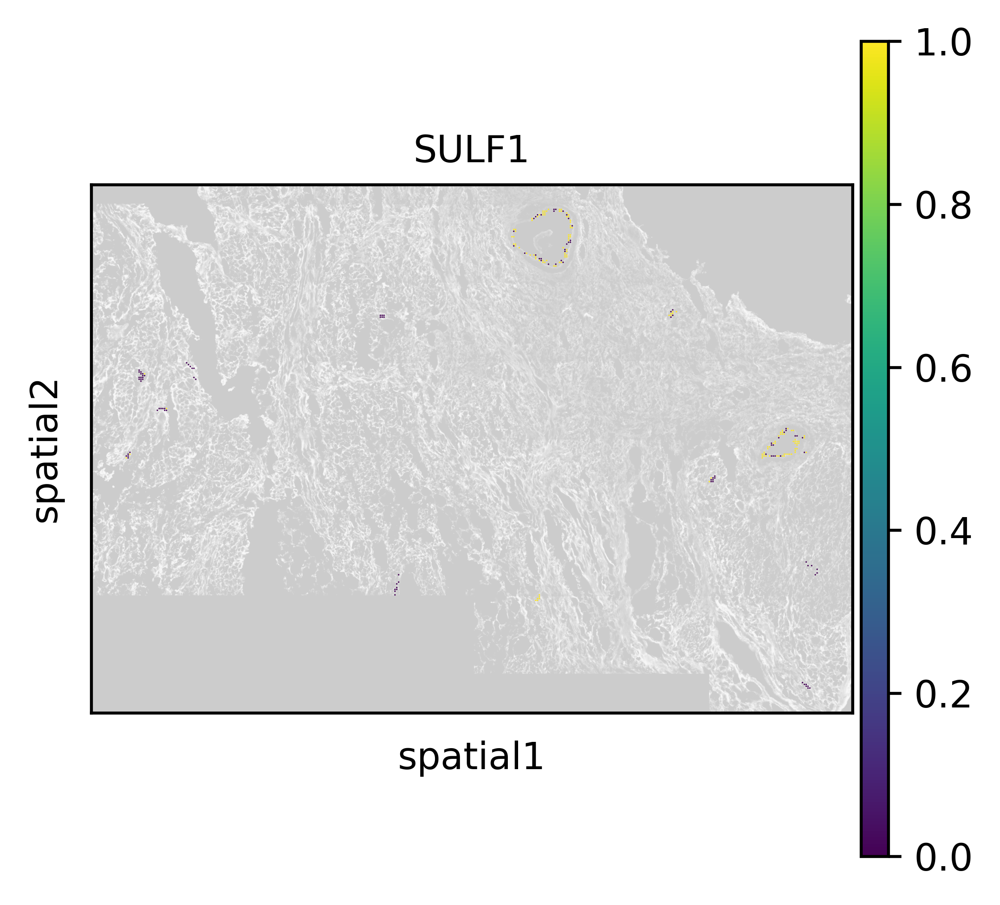

In [89]:
sc.pl.spatial(adata_aec_subset,color="SULF1",img_key='WGA',size=8, alpha_img = 0.2, vmax = 1)

In [50]:
group=pd.Series("Large", index=results2.index)

In [51]:
group[results2["size"] <= 30] = "Small"

In [52]:
group

ROI_A2-1_109    Small
ROI_A2-1_12     Large
ROI_A2-1_22     Small
ROI_A2-1_25     Small
ROI_A2-1_26     Large
ROI_A2-1_27     Small
ROI_A2-1_4      Small
ROI_A2-1_42     Small
ROI_A2-1_51     Small
ROI_A2-1_6      Small
ROI_A2-1_62     Small
ROI_A2-1_69     Small
ROI_A2-1_79     Small
dtype: object

In [53]:
results2["group"] = group

In [54]:
results2

,SULF1+NEBL_percent,SULF1_percent,NEBL_percent,SULF1,NEBL,SEMA3G,RGCC,size,ROI,group
ROI_A2-1_109,0.0,0.000000,0.166667,NaN,2.00,1.800000,1.500000,6,A2-1,Small
ROI_A2-1_12,0.0,0.523077,0.000000,2.653061,1.00,1.187500,1.000000,65,A2-1,Large
ROI_A2-1_22,0.0,0.111111,0.000000,1.500000,1.00,1.250000,NaN,9,A2-1,Small
ROI_A2-1_25,0.0,0.000000,0.500000,NaN,2.25,1.000000,4.000000,6,A2-1,Small
ROI_A2-1_26,0.0,0.511111,0.000000,4.016129,NaN,1.000000,1.000000,90,A2-1,Large
ROI_A2-1_27,0.0,0.000000,0.000000,1.000000,1.00,1.285714,1.000000,15,A2-1,Small
ROI_A2-1_4,0.0,0.000000,0.142857,NaN,1.50,NaN,3.333333,7,A2-1,Small
ROI_A2-1_42,0.0,0.000000,0.000000,1.000000,1.00,1.000000,2.000000,7,A2-1,Small
ROI_A2-1_51,0.0,0.000000,0.000000,1.000000,1.00,NaN,2.000000,8,A2-1,Small
ROI_A2-1_6,0.0,0.000000,0.000000,NaN,1.00,NaN,2.750000,8,A2-1,Small


In [53]:
results4 = results2.drop(["ROI_A2-1_25"])

In [56]:
results4.to_csv("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Arterial_quantification/A2-1.csv")

In [55]:
results4.to_csv("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Arterial_quantification/ROI_df/A2-1.csv")